In [13]:
import numpy as np
import pandas as pd 
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras import layers
from time import perf_counter 
import os
from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns
import matplotlib.pyplot as plt 

In [78]:
## Defining batch specfications
batch_size = 100
img_height = 250
img_width = 250
num_classes = len(class_names)

In [3]:
## loading training set
training_ds = tf.keras.preprocessing.image_dataset_from_directory(
    'Dataset/Accident_Data/train',
    seed=42,
    image_size= (img_height, img_width),
    batch_size=batch_size

)

Found 791 files belonging to 2 classes.


In [4]:
## loading validation dataset
validation_ds =  tf.keras.preprocessing.image_dataset_from_directory(
    'Dataset/Accident_Data/val',
    seed=42,
    image_size= (img_height, img_width),
    batch_size=batch_size)


Found 98 files belonging to 2 classes.


In [5]:
testing_ds = tf.keras.preprocessing.image_dataset_from_directory(
    'Dataset/Accident_Data/test',
    seed=42,
    image_size= (img_height, img_width),
    batch_size=batch_size)

class_names = training_ds.class_names

## Configuring dataset for performance
AUTOTUNE = tf.data.experimental.AUTOTUNE
training_ds = training_ds.cache().prefetch(buffer_size=AUTOTUNE)
testing_ds = testing_ds.cache().prefetch(buffer_size=AUTOTUNE)



Found 100 files belonging to 2 classes.


In [28]:
## Defining Cnn
MyCnn = tf.keras.models.Sequential([
  layers.BatchNormalization(),
  layers.Conv2D(32, 3, activation='relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(64, 3, activation='relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(128, 3, activation='relu'),
  layers.MaxPooling2D(),
  layers.Flatten(),
  layers.Dense(256, activation='relu'),
  layers.Dense(len(class_names), activation= 'softmax')
])

MyCnn.compile(optimizer='adam',loss='sparse_categorical_crossentropy', metrics=['accuracy'])

In [43]:
## lets train our CNN
retVal = MyCnn.fit(training_ds, validation_data= validation_ds, epochs = 100)

Epoch 1/100
8/8 [==============================] - 145s 16s/step - loss: 6.4429 - accuracy: 0.4943 - val_loss: 1.0619 - val_accuracy: 0.5306
Epoch 2/100
8/8 [==============================] - 142s 18s/step - loss: 0.6839 - accuracy: 0.5424 - val_loss: 0.6870 - val_accuracy: 0.5510
Epoch 3/100
8/8 [==============================] - 136s 17s/step - loss: 0.6092 - accuracy: 0.6814 - val_loss: 0.6431 - val_accuracy: 0.7245
Epoch 4/100
8/8 [==============================] - 136s 17s/step - loss: 0.5508 - accuracy: 0.7484 - val_loss: 0.5251 - val_accuracy: 0.7755
Epoch 5/100
8/8 [==============================] - 140s 17s/step - loss: 0.4853 - accuracy: 0.7636 - val_loss: 0.4885 - val_accuracy: 0.7347
Epoch 6/100
8/8 [==============================] - 135s 17s/step - loss: 0.4068 - accuracy: 0.8142 - val_loss: 0.3384 - val_accuracy: 0.8265
Epoch 7/100
8/8 [==============================] - 129s 16s/step - loss: 0.3278 - accuracy: 0.8748 - val_loss: 0.3875 - val_accuracy: 0.7857
Epoch 8/100
8

Epoch 59/100
8/8 [==============================] - 111s 14s/step - loss: 0.0096 - accuracy: 0.9949 - val_loss: 0.2094 - val_accuracy: 0.9388
Epoch 60/100
8/8 [==============================] - 109s 14s/step - loss: 0.0098 - accuracy: 0.9949 - val_loss: 0.2110 - val_accuracy: 0.9388
Epoch 61/100
8/8 [==============================] - 108s 14s/step - loss: 0.0106 - accuracy: 0.9949 - val_loss: 0.2093 - val_accuracy: 0.9388
Epoch 62/100
8/8 [==============================] - 108s 14s/step - loss: 0.0102 - accuracy: 0.9949 - val_loss: 0.2137 - val_accuracy: 0.9388
Epoch 63/100
8/8 [==============================] - 109s 14s/step - loss: 0.0093 - accuracy: 0.9949 - val_loss: 0.2140 - val_accuracy: 0.9388
Epoch 64/100
8/8 [==============================] - 110s 14s/step - loss: 0.0093 - accuracy: 0.9949 - val_loss: 0.2132 - val_accuracy: 0.9388
Epoch 65/100
8/8 [==============================] - 109s 14s/step - loss: 0.0098 - accuracy: 0.9949 - val_loss: 0.2140 - val_accuracy: 0.9388
Epoch 

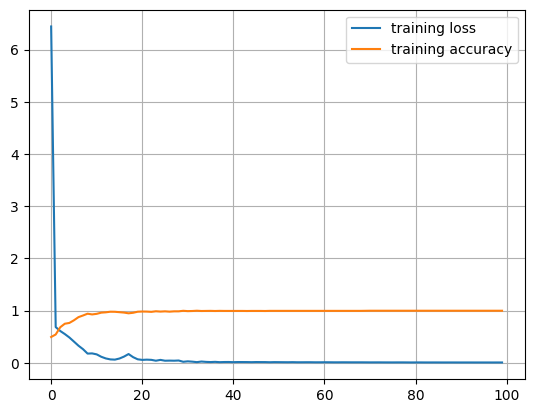

In [44]:
## stats on training data
plt.plot(retVal.history['loss'], label = 'training loss')
plt.plot(retVal.history['accuracy'], label = 'training accuracy')
plt.grid(True)
plt.legend()

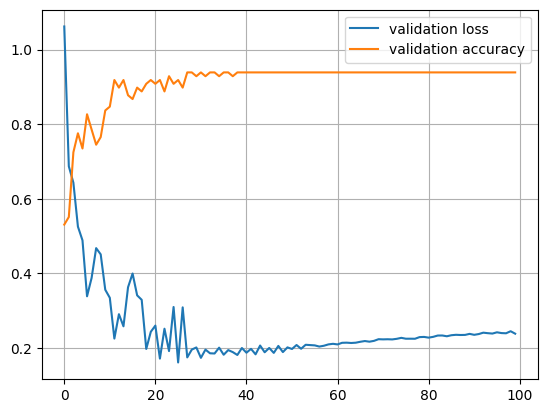

In [45]:
## stats on validation data
plt.plot(retVal.history['val_loss'], label = 'validation loss')
plt.plot(retVal.history['val_accuracy'], label = 'validation accuracy')
plt.grid(True)
plt.legend()

4/4 [==============================] - 4s 760ms/step


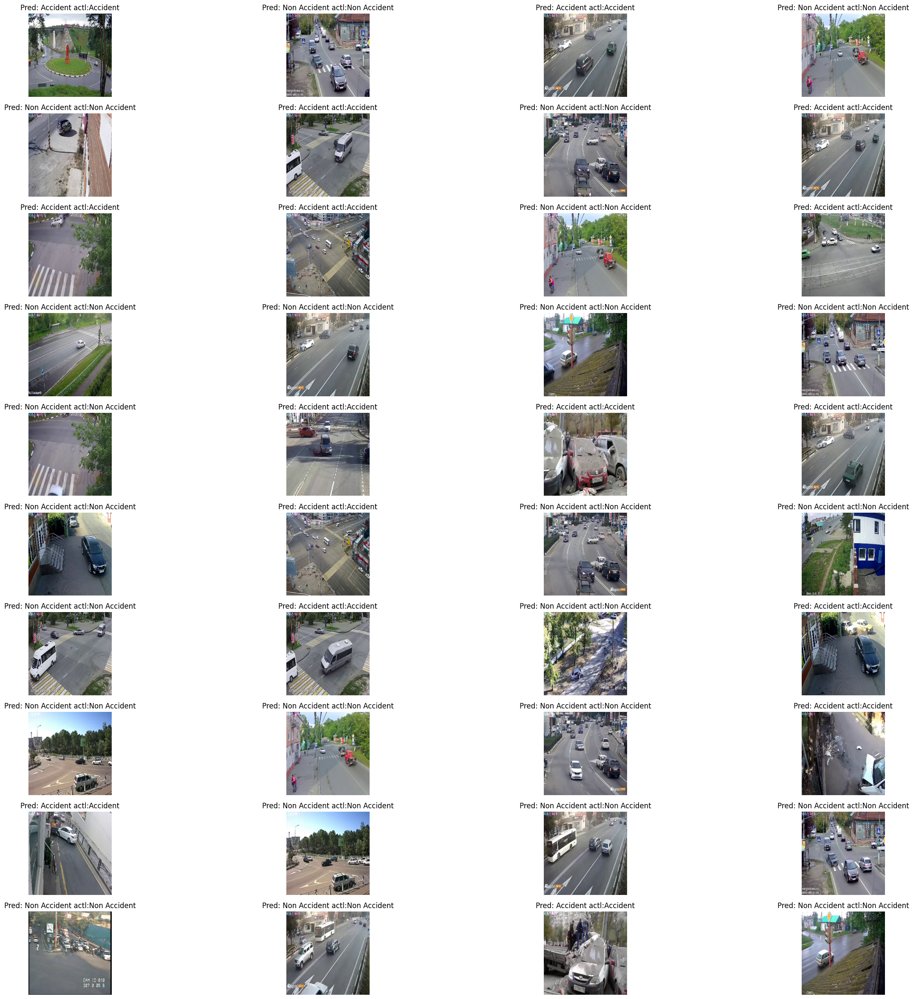

In [46]:
## lets vizualize results on testing data
AccuracyVector = []
plt.figure(figsize=(30, 30))
for images, labels in testing_ds.take(1):
    predictions = MyCnn.predict(images)
    predlabel = []
    prdlbl = []
    
    for mem in predictions:
        predlabel.append(class_names[np.argmax(mem)])
        prdlbl.append(np.argmax(mem))
    
    AccuracyVector = np.array(prdlbl) == labels
    for i in range(40):
        ax = plt.subplot(10, 4, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.title('Pred: '+ predlabel[i]+' actl:'+class_names[labels[i]] )
        plt.axis('off')
        plt.grid(True)

In [47]:
MyCnn.save('MyCnnAccidentModel.h5')

In [48]:
# Step 1: Make predictions on the test dataset
predictions = np.argmax(MyCnn.predict(testing_ds), axis=-1)


1/1 [==============================] - 3s 3s/step


In [49]:
# Get true labels
true_labels = np.concatenate([y for x, y in testing_ds], axis=0)

In [50]:
# Step 2: Calculate confusion matrix
conf_matrix = confusion_matrix(true_labels, predictions)

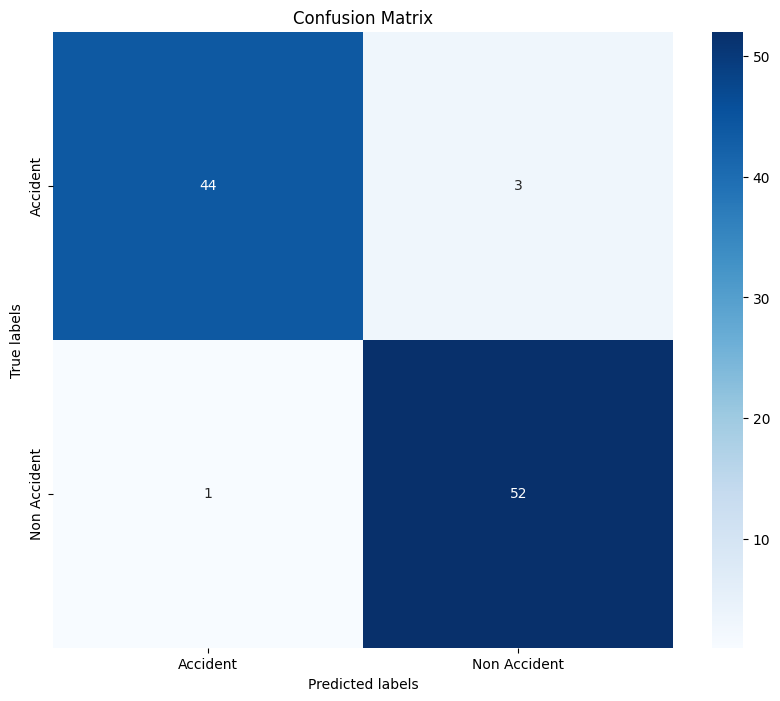

In [51]:
# Step 3: Plot confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix')
plt.show()

In [52]:
# Step 4: Print classification report
print("Classification Report:")
print(classification_report(true_labels, predictions, target_names=class_names))

Classification Report:
              precision    recall  f1-score   support

    Accident       0.98      0.94      0.96        47
Non Accident       0.95      0.98      0.96        53

    accuracy                           0.96       100
   macro avg       0.96      0.96      0.96       100
weighted avg       0.96      0.96      0.96       100



In [53]:
# Step 5: Print accuracy
accuracy = np.sum(predictions == true_labels) / len(true_labels)
print("Accuracy:", accuracy)

Accuracy: 0.96


# LSTM MODEL

In [54]:
## Defining batch specfications
batch_size = 100
img_height = 250
img_width = 250

In [55]:
## loading training set
training_ds = tf.keras.preprocessing.image_dataset_from_directory(
    'Dataset/Accident_Data/train',
    seed=42,
    image_size= (img_height, img_width),
    batch_size=batch_size

)

Found 791 files belonging to 2 classes.


In [56]:
## loading validation dataset
validation_ds =  tf.keras.preprocessing.image_dataset_from_directory(
    'Dataset/Accident_Data/val',
    seed=42,
    image_size= (img_height, img_width),
    batch_size=batch_size)


Found 98 files belonging to 2 classes.


In [57]:
testing_ds = tf.keras.preprocessing.image_dataset_from_directory(
    'Dataset/Accident_Data/test',
    seed=42,
    image_size= (img_height, img_width),
    batch_size=batch_size)

class_names = training_ds.class_names

## Configuring dataset for performance
AUTOTUNE = tf.data.experimental.AUTOTUNE
training_ds = training_ds.cache().prefetch(buffer_size=AUTOTUNE)
testing_ds = testing_ds.cache().prefetch(buffer_size=AUTOTUNE)



Found 100 files belonging to 2 classes.


In [58]:
# Define LSTM model
MyLSTM = tf.keras.models.Sequential([
    layers.Rescaling(1./255, input_shape=(img_height, img_width, 3)),  # Rescale input images
    layers.Lambda(lambda x: tf.reshape(x, (-1, img_width, 3*img_height))),  # Reshape the input data
    layers.LSTM(32, return_sequences=True),
    layers.LSTM(32),
    layers.Dense(128, activation='relu'),
    layers.Dense(len(class_names), activation='softmax')
])

In [59]:
# Compile the LSTM model
MyLSTM.compile(optimizer='adam',
               loss='sparse_categorical_crossentropy',
               metrics=['accuracy'])

In [61]:
## lets train our CNN
retVal = MyLSTM.fit(training_ds, validation_data= validation_ds, epochs = 200)

Epoch 1/200
8/8 [==============================] - 7s 907ms/step - loss: 0.5933 - accuracy: 0.6675 - val_loss: 0.5648 - val_accuracy: 0.7347
Epoch 2/200
8/8 [==============================] - 7s 888ms/step - loss: 0.5840 - accuracy: 0.6827 - val_loss: 0.5436 - val_accuracy: 0.7653
Epoch 3/200
8/8 [==============================] - 7s 837ms/step - loss: 0.5771 - accuracy: 0.6751 - val_loss: 0.5350 - val_accuracy: 0.6939
Epoch 4/200
8/8 [==============================] - 7s 940ms/step - loss: 0.5824 - accuracy: 0.6776 - val_loss: 0.5587 - val_accuracy: 0.7041
Epoch 5/200
8/8 [==============================] - 9s 1s/step - loss: 0.5771 - accuracy: 0.6903 - val_loss: 0.5448 - val_accuracy: 0.7143
Epoch 6/200
8/8 [==============================] - 8s 999ms/step - loss: 0.5894 - accuracy: 0.6688 - val_loss: 0.5448 - val_accuracy: 0.7347
Epoch 7/200
8/8 [==============================] - 7s 792ms/step - loss: 0.5879 - accuracy: 0.6688 - val_loss: 0.5387 - val_accuracy: 0.6837
Epoch 8/200
8/8 

Epoch 59/200
8/8 [==============================] - 11s 1s/step - loss: 0.5334 - accuracy: 0.7067 - val_loss: 0.5092 - val_accuracy: 0.7245
Epoch 60/200
8/8 [==============================] - 16s 2s/step - loss: 0.5439 - accuracy: 0.6953 - val_loss: 0.5254 - val_accuracy: 0.6939
Epoch 61/200
8/8 [==============================] - 21s 3s/step - loss: 0.5360 - accuracy: 0.6903 - val_loss: 0.5188 - val_accuracy: 0.7449
Epoch 62/200
8/8 [==============================] - 17s 2s/step - loss: 0.5284 - accuracy: 0.7016 - val_loss: 0.5065 - val_accuracy: 0.7347
Epoch 63/200
8/8 [==============================] - 15s 2s/step - loss: 0.5273 - accuracy: 0.7130 - val_loss: 0.5071 - val_accuracy: 0.7449
Epoch 64/200
8/8 [==============================] - 13s 2s/step - loss: 0.5267 - accuracy: 0.7067 - val_loss: 0.5089 - val_accuracy: 0.7245
Epoch 65/200
8/8 [==============================] - 16s 2s/step - loss: 0.5258 - accuracy: 0.7092 - val_loss: 0.5017 - val_accuracy: 0.7551
Epoch 66/200
8/8 [==

8/8 [==============================] - 9s 1s/step - loss: 0.3657 - accuracy: 0.8154 - val_loss: 0.4541 - val_accuracy: 0.8367
Epoch 118/200
8/8 [==============================] - 9s 1s/step - loss: 0.3766 - accuracy: 0.8116 - val_loss: 0.4503 - val_accuracy: 0.8469
Epoch 119/200
8/8 [==============================] - 8s 1s/step - loss: 0.3580 - accuracy: 0.8369 - val_loss: 0.4354 - val_accuracy: 0.8163
Epoch 120/200
8/8 [==============================] - 8s 1s/step - loss: 0.3396 - accuracy: 0.8382 - val_loss: 0.4387 - val_accuracy: 0.8061
Epoch 121/200
8/8 [==============================] - 8s 982ms/step - loss: 0.3361 - accuracy: 0.8407 - val_loss: 0.4201 - val_accuracy: 0.8673
Epoch 122/200
8/8 [==============================] - 8s 1s/step - loss: 0.3714 - accuracy: 0.8230 - val_loss: 0.5163 - val_accuracy: 0.7449
Epoch 123/200
8/8 [==============================] - 9s 1s/step - loss: 0.4005 - accuracy: 0.8003 - val_loss: 0.5055 - val_accuracy: 0.7347
Epoch 124/200
8/8 [============

8/8 [==============================] - 8s 1s/step - loss: 0.2447 - accuracy: 0.8976 - val_loss: 0.4802 - val_accuracy: 0.8469
Epoch 176/200
8/8 [==============================] - 8s 968ms/step - loss: 0.2224 - accuracy: 0.9178 - val_loss: 0.3968 - val_accuracy: 0.8571
Epoch 177/200
8/8 [==============================] - 8s 961ms/step - loss: 0.2319 - accuracy: 0.8963 - val_loss: 0.4522 - val_accuracy: 0.8469
Epoch 178/200
8/8 [==============================] - 8s 1s/step - loss: 0.2698 - accuracy: 0.8963 - val_loss: 0.4198 - val_accuracy: 0.8776
Epoch 179/200
8/8 [==============================] - 8s 1s/step - loss: 0.2435 - accuracy: 0.8887 - val_loss: 0.4445 - val_accuracy: 0.8673
Epoch 180/200
8/8 [==============================] - 8s 973ms/step - loss: 0.2328 - accuracy: 0.9027 - val_loss: 0.4483 - val_accuracy: 0.8571
Epoch 181/200
8/8 [==============================] - 7s 948ms/step - loss: 0.2218 - accuracy: 0.9090 - val_loss: 0.4592 - val_accuracy: 0.8571
Epoch 182/200
8/8 [===

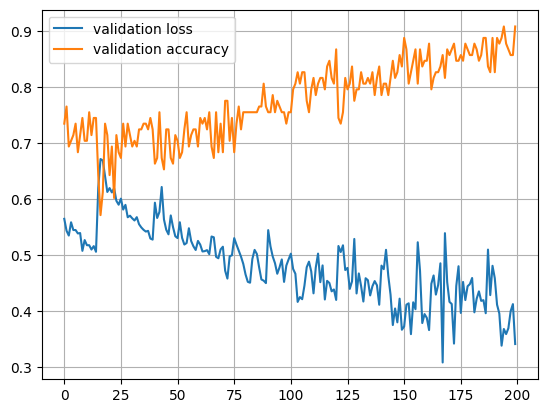

In [62]:
## stats on validation data
plt.plot(retVal.history['val_loss'], label = 'validation loss')
plt.plot(retVal.history['val_accuracy'], label = 'validation accuracy')
plt.grid(True)
plt.legend()

4/4 [==============================] - 4s 154ms/step


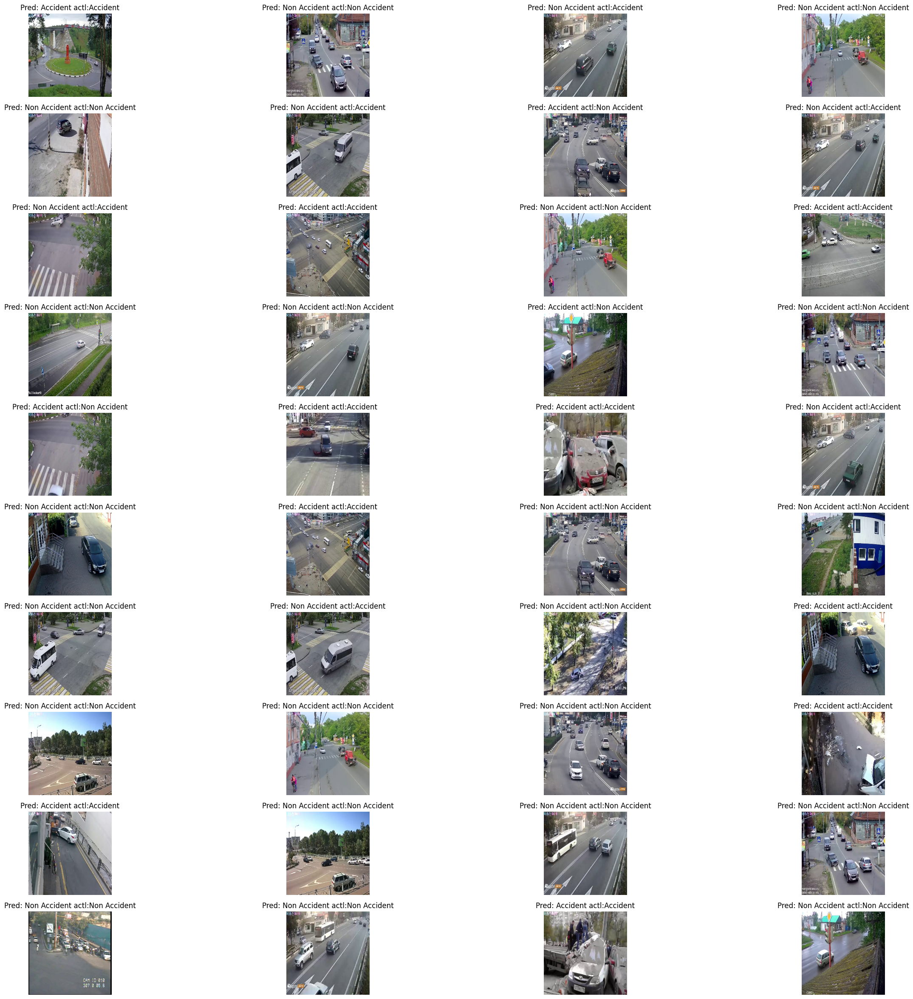

In [63]:
## lets vizualize results on testing data
AccuracyVector = []
plt.figure(figsize=(30, 30))
for images, labels in testing_ds.take(1):
    predictions = MyLSTM.predict(images)
    predlabel = []
    prdlbl = []
    
    for mem in predictions:
        predlabel.append(class_names[np.argmax(mem)])
        prdlbl.append(np.argmax(mem))
    
    AccuracyVector = np.array(prdlbl) == labels
    for i in range(40):
        ax = plt.subplot(10, 4, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.title('Pred: '+ predlabel[i]+' actl:'+class_names[labels[i]] )
        plt.axis('off')
        plt.grid(True)

In [64]:
MyLSTM.save('MyLSTMAccidentModel.h5')

In [65]:
# Step 1: Make predictions on the test dataset
predictions = np.argmax(MyLSTM.predict(testing_ds), axis=-1)


1/1 [==============================] - 3s 3s/step


In [66]:
# Get true labels
true_labels = np.concatenate([y for x, y in testing_ds], axis=0)

In [67]:
# Step 2: Calculate confusion matrix
conf_matrix = confusion_matrix(true_labels, predictions)

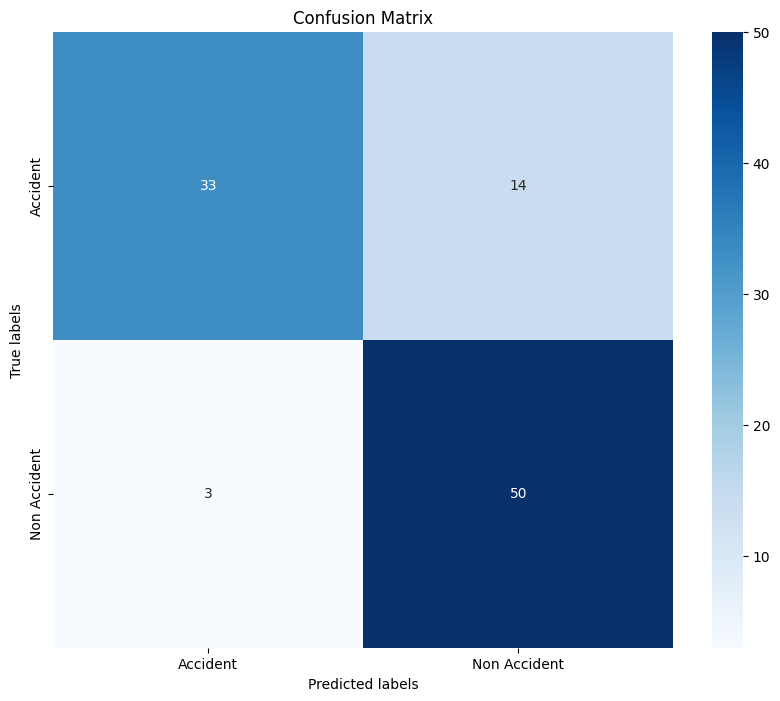

In [68]:
# Step 3: Plot confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix')
plt.show()

In [69]:
# Step 4: Print classification report
print("Classification Report:")
print(classification_report(true_labels, predictions, target_names=class_names))

Classification Report:
              precision    recall  f1-score   support

    Accident       0.92      0.70      0.80        47
Non Accident       0.78      0.94      0.85        53

    accuracy                           0.83       100
   macro avg       0.85      0.82      0.82       100
weighted avg       0.84      0.83      0.83       100



In [70]:
# Step 5: Print accuracy
accuracy = np.sum(predictions == true_labels) / len(true_labels)
print("Accuracy:", accuracy)

Accuracy: 0.83


# CNN+LSTM

In [71]:
# Load and compile the pre-trained CNN model
cnn_model = tf.keras.models.load_model('MyCnnAccidentModel.h5')

In [72]:
# Load and compile the pre-trained LSTM model
lstm_model = tf.keras.models.load_model('MyLSTMAccidentModel.h5')

In [79]:
# Define combined model by combining outputs of CNN and LSTM
combined_model = tf.keras.Sequential([
    cnn_model,
    layers.Reshape((-1, cnn_model.output_shape[1])),

    # Assuming LSTM input shape requires this reshape
    layers.LSTM(64, return_sequences=True),
    layers.LSTM(64),
    layers.Dense(num_classes, activation='softmax')
])

In [80]:
# Compile the combined model
combined_model.compile(optimizer='adam',
                       loss='sparse_categorical_crossentropy',
                       metrics=['accuracy'])


In [82]:
# Train the combined model
history = combined_model.fit(training_ds, validation_data=validation_ds, epochs=50)

Epoch 1/50
8/8 [==============================] - 172s 22s/step - loss: 0.6812 - accuracy: 0.9949 - val_loss: 0.6758 - val_accuracy: 0.9388
Epoch 2/50
8/8 [==============================] - 142s 17s/step - loss: 0.6678 - accuracy: 0.9823 - val_loss: 0.6608 - val_accuracy: 0.9592
Epoch 3/50
8/8 [==============================] - 110s 14s/step - loss: 0.6484 - accuracy: 0.9874 - val_loss: 0.6403 - val_accuracy: 0.9490
Epoch 4/50
8/8 [==============================] - 118s 15s/step - loss: 0.6217 - accuracy: 0.9836 - val_loss: 0.6123 - val_accuracy: 0.9286
Epoch 5/50
8/8 [==============================] - 114s 14s/step - loss: 0.5852 - accuracy: 0.9722 - val_loss: 0.5734 - val_accuracy: 0.9286
Epoch 6/50
8/8 [==============================] - 113s 14s/step - loss: 0.5297 - accuracy: 0.9785 - val_loss: 0.5278 - val_accuracy: 0.9082
Epoch 7/50
8/8 [==============================] - 113s 14s/step - loss: 0.4655 - accuracy: 0.9722 - val_loss: 0.4645 - val_accuracy: 0.9082
Epoch 8/50
8/8 [====

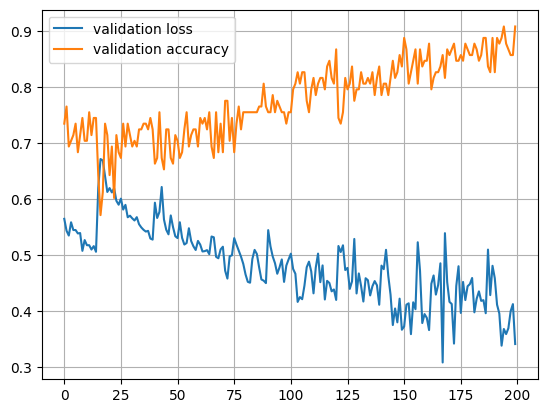

In [83]:
## stats on validation data
plt.plot(retVal.history['val_loss'], label = 'validation loss')
plt.plot(retVal.history['val_accuracy'], label = 'validation accuracy')
plt.grid(True)
plt.legend()

4/4 [==============================] - 1s 139ms/step


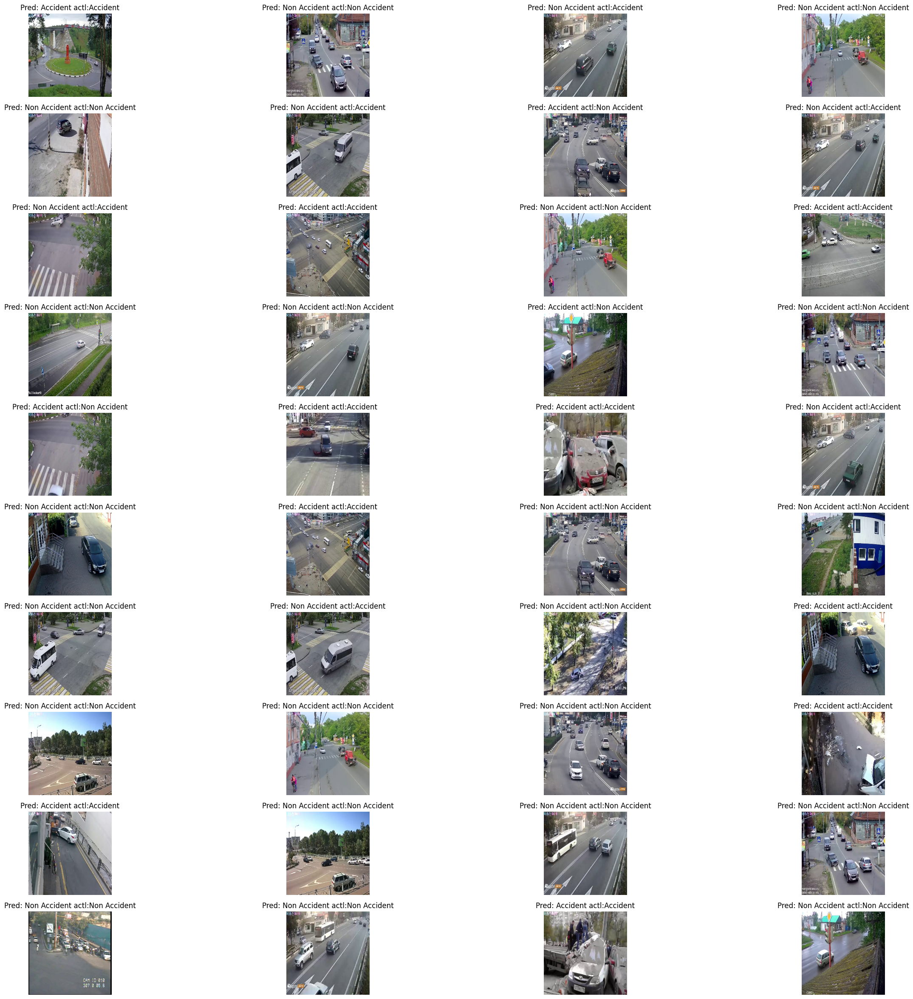

In [84]:
## lets vizualize results on testing data
AccuracyVector = []
plt.figure(figsize=(30, 30))
for images, labels in testing_ds.take(1):
    predictions = MyLSTM.predict(images)
    predlabel = []
    prdlbl = []
    
    for mem in predictions:
        predlabel.append(class_names[np.argmax(mem)])
        prdlbl.append(np.argmax(mem))
    
    AccuracyVector = np.array(prdlbl) == labels
    for i in range(40):
        ax = plt.subplot(10, 4, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.title('Pred: '+ predlabel[i]+' actl:'+class_names[labels[i]] )
        plt.axis('off')
        plt.grid(True)

In [85]:
combined_model.save('CombinedModel.h5')

In [86]:
# Step 1: Make predictions on the test dataset
predictions = np.argmax(combined_model.predict(testing_ds), axis=-1)


1/1 [==============================] - 6s 6s/step


In [87]:
# Get true labels
true_labels = np.concatenate([y for x, y in testing_ds], axis=0)

In [88]:
# Step 2: Calculate confusion matrix
conf_matrix = confusion_matrix(true_labels, predictions)

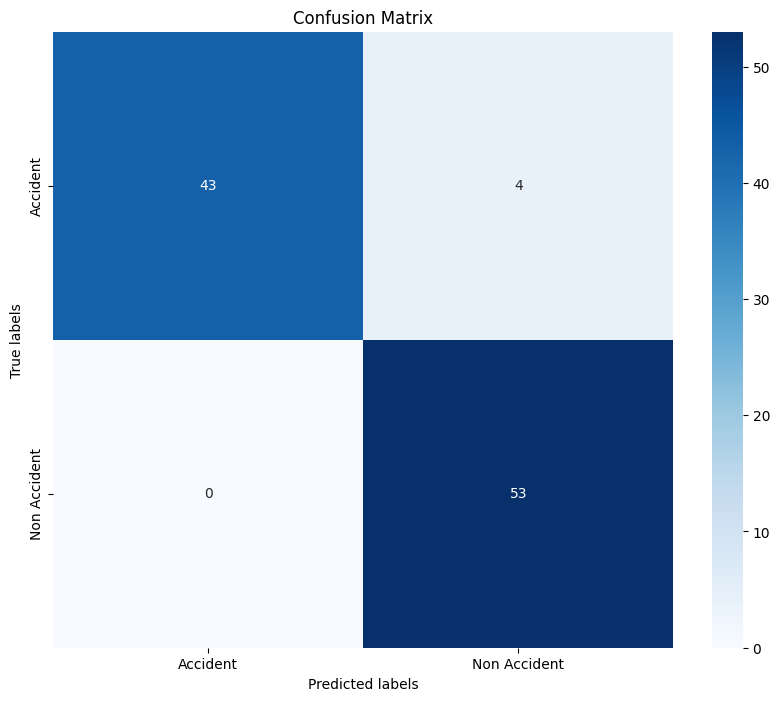

In [89]:
# Step 3: Plot confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix')
plt.show()

In [90]:
# Step 4: Print classification report
print("Classification Report:")
print(classification_report(true_labels, predictions, target_names=class_names))

Classification Report:
              precision    recall  f1-score   support

    Accident       1.00      0.91      0.96        47
Non Accident       0.93      1.00      0.96        53

    accuracy                           0.96       100
   macro avg       0.96      0.96      0.96       100
weighted avg       0.96      0.96      0.96       100



In [91]:
# Step 5: Print accuracy
accuracy = np.sum(predictions == true_labels) / len(true_labels)
print("Accuracy:", accuracy)

Accuracy: 0.96
